In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
import pandas as pd
from pandas.plotting import register_matplotlib_converters
import os
import math
from sklearn.cluster import KMeans
from sklearn.metrics import precision_score
import seaborn as sns
from sklearn import metrics
import time
import pickle
import metric_learn
from sklearn.decomposition import PCA  
from sklearn import cluster, datasets, mixture
from sklearn.neighbors import LocalOutlierFactor
from tensorflow.python.client import device_lib; print(device_lib.list_local_devices())
import tensorflow as tf
tf.config.list_physical_devices('GPU')
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from primitives.utils import plot, plot_ts, plot_rws, plot_error, unroll_ts
from utils import make_data, make_data_rev, make_label, calc_leq, leq_filter, validate, figure, figure_detail, plot_timeseries, fig_pr, auc_gs, fig_th_f

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 16702905147246189808
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 7798259712
locality {
  bus_id: 1
  links {
  }
}
incarnation: 10736904585444330798
physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 3080, pci bus id: 0000:01:00.0, compute capability: 8.6"
xla_global_id: 416903419
]
[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 4483944152330245809
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 7798259712
locality {
  bus_id: 1
  links {
  }
}
incarnation: 3837143858507643007
physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 3080, pci bus id: 0000:01:00.0, compute capability: 8.6"
xla_global_id: 416903419
]


In [2]:
def rolling_window_sequences(X, window_size, target_size, step_size, target_column,
                             drop=None, drop_windows=False):
    out_X = list()
    out_y = list()
    target = X[:, target_column]

    if drop_windows:
        if hasattr(drop, '__len__') and (not isinstance(drop, str)):
            if len(drop) != len(X):
                raise Exception('Arrays `drop` and `X` must be of the same length.')
        else:
            if isinstance(drop, float) and np.isnan(drop):
                drop = np.isnan(X)
            else:
                drop = X == drop

    start = 0
    max_start = len(X) - window_size - target_size + 1
    while start < max_start:
        end = start + window_size

        if drop_windows:
            drop_window = drop[start:end + target_size]
            to_drop = np.where(drop_window)[0]
            if to_drop.size:
                start += to_drop[-1] + 1
                continue

        out_X.append(X[start:end])
        out_y.append(target[end:end + target_size])

        start = start + step_size

    return np.asarray(out_X), np.asarray(out_y)


In [3]:
data_dir='filtered_csv_label'
original = pd.read_csv( os.path.join(data_dir, 'learning_data_10.csv') )
df = pd.read_csv( os.path.join(data_dir, 'learning_data_10.csv') )
train_df=df[(df['day']!=1)&(df['day']<3)]
test_df=df[df['day']==1]

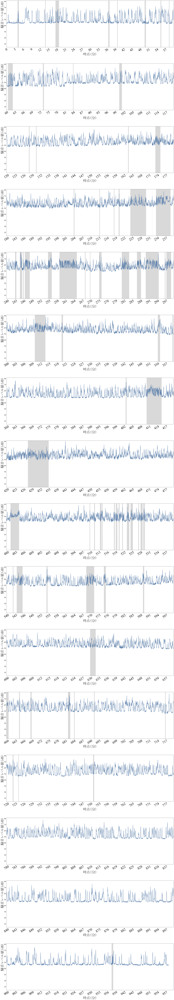

In [4]:
plot_timeseries([test_df['original'].values], test_df['label'].values)

In [5]:
X_train=train_df[['original']].values
X_test=test_df[['original']].values

In [6]:
scaler = MinMaxScaler(feature_range=(-1, 1))
scaler.fit(X_train)
X_train=scaler.transform(X_train)
X_test=scaler.transform(X_test)

In [7]:
# window_sizeは18以上にする
window_size=18
target_size=1
step_size=1
x_train, y_train = rolling_window_sequences(X_train, 
                                            window_size=window_size,
                                            target_size=target_size, 
                                            step_size=step_size, 
                                            target_column=0)
x_test, y_test = rolling_window_sequences(X_test, 
                                            window_size=window_size,
                                            target_size=target_size, 
                                            step_size=step_size, 
                                            target_column=0)

In [8]:
print("Training data input shape: {}".format(x_train.shape))
print("Training y shape: {}".format(y_train.shape))
print("Testing data input shape: {}".format(x_test.shape))
print("Testing y shape: {}".format(y_test.shape))

Training data input shape: (863952, 18, 1)
Training y shape: (863952, 1)
Testing data input shape: (287467, 18, 1)
Testing y shape: (287467, 1)


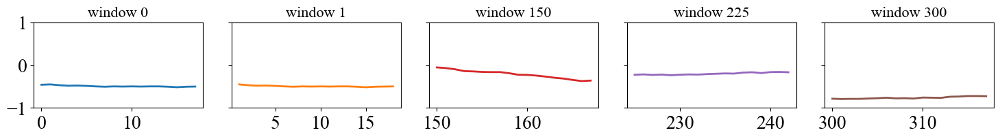

In [9]:
plot_rws(x_train, window=window_size)

In [10]:
from primitives.model import hyperparameters
from primitives.model import encoder
from primitives.model import generator
from primitives.tadgan import TadGAN

latent_dim=5
encoder[0]['parameters']['units']=window_size
encoder[2]['parameters']['units']=latent_dim

generator[1]['parameters']['units']=window_size//2
generator[3]['parameters']['layer']['parameters']['units']=(64*window_size)//100
generator[5]['parameters']['layer']['parameters']['units']=(64*window_size)//100

hyperparameters["epochs"] = 1
hyperparameters["input_shape"] = (window_size, 1) # based on the window size
hyperparameters["target_shape"] = (window_size, 1)
hyperparameters["optimizer"] = "tensorflow.keras.optimizers.Adam"
hyperparameters["learning_rate"] = 0.0005
hyperparameters["latent_dim"] = latent_dim
hyperparameters["batch_size"] = 64

In [11]:
tgan = TadGAN(**hyperparameters)
tgan.fit(x_train)

Epoch: 1/1, Losses: {'cx_loss': -0.0921, 'cz_loss': -1.6327, 'eg_loss': -2.1096}


8984/8984 [==============================] - 9s 1ms/step


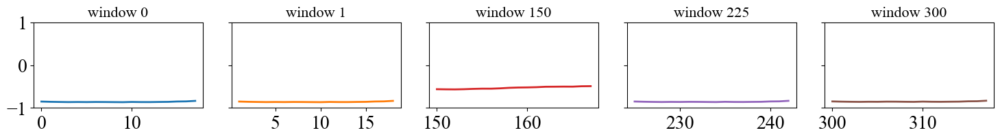

In [12]:
# reconstruct
X_hat, critic = tgan.predict(x_test)

# visualize X_hat
plot_rws(X_hat, window=window_size)

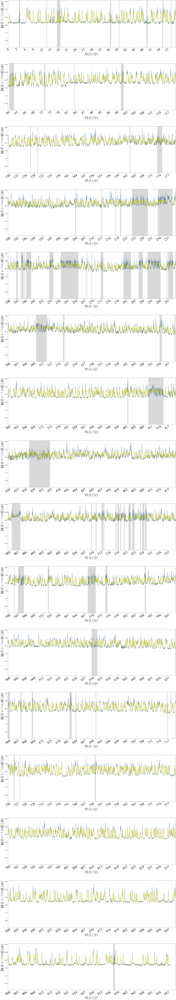

In [13]:
# flatten the predicted windows
y_hat = unroll_ts(X_hat)

# plot the time series
plot_timeseries([y_test, y_hat], test_df['label'].values[window_size:])

In [14]:
from primitives.tadgan import score_anomalies
error, true, pred = score_anomalies(x_test, X_hat, critic, rec_error_type="dtw", comb="mult")
pred = np.array(pred).mean(axis=2)

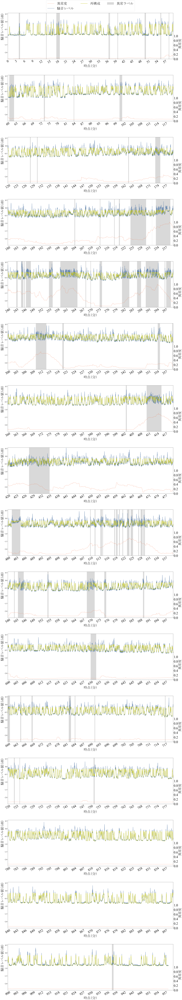

In [15]:
anomary_score=(error-error.min())/(error.max()-error.min())
# visualize the error curve
plot_timeseries([np.array(true), np.array(pred)], test_df['label'].values[:-1], anomary_score)